In [2]:
#install extra libraries we need
!pip install geopandas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 4.6 MB/s 
     |████████████████████████████████| 6.3 MB 45.8 MB/s 
     |████████████████████████████████| 16.7 MB 42.2 MB/s 


First we need to connect our directory with the notebook by mounting google drive

In [3]:
#mount google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Next, we navigate to where the data is stored (you can determine the file path by using the file navigation menu on the left).

In [4]:
#path to data within drive
DATA_path = '/content/drive/MyDrive/AI for Trees Share/01. Data'

As a simple example, let's read in and display an RGB image from the dataset.

/content/drive/MyDrive/AI for Trees Share/01. Data/2021/img/ZK17.tif


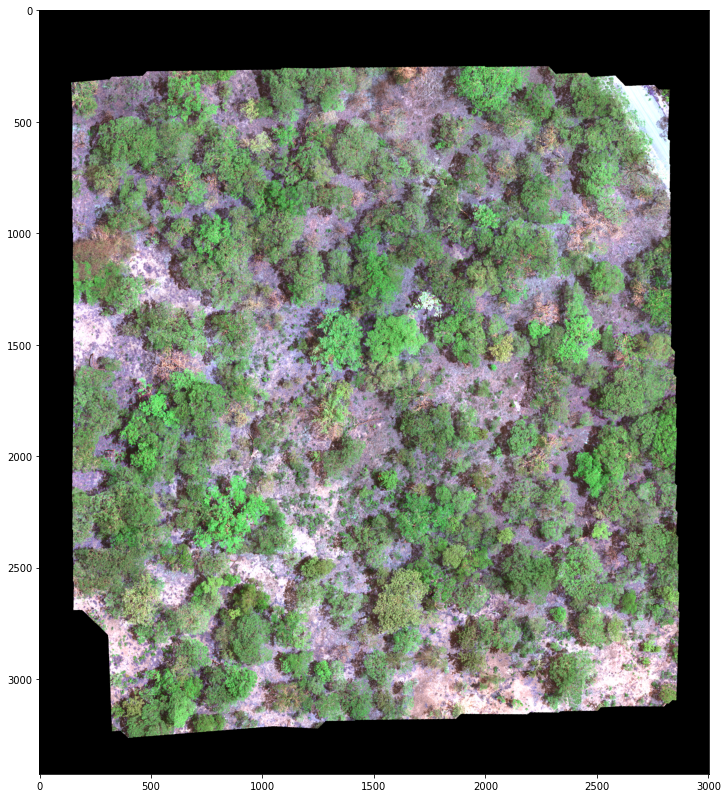

In [7]:
#import matplotlib
import matplotlib.pyplot as plt
#import opencv library
import cv2

#path to selected image in data
img_path = DATA_path+'/2021/img/ZK17.tif'
print(img_path)

#read in image to numpy array using opencv library
img_array = cv2.imread(img_path)

#display the image
plt.figure(figsize=(12,16))
plt.imshow(img_array)

In [24]:
#read in image to numpy array using opencv library
img_array = cv2.imread(img_path)

#display the image
plt.figure(figsize=(12,16))
plt.imshow(img_array[1200:1800, 1000:1500])

#display the image
plt.figure(figsize=(12,16))
plt.title("Example Tile 256x256")
plt.imshow(img_array[1200:1456, 1100:1356])

Output hidden; open in https://colab.research.google.com to view.

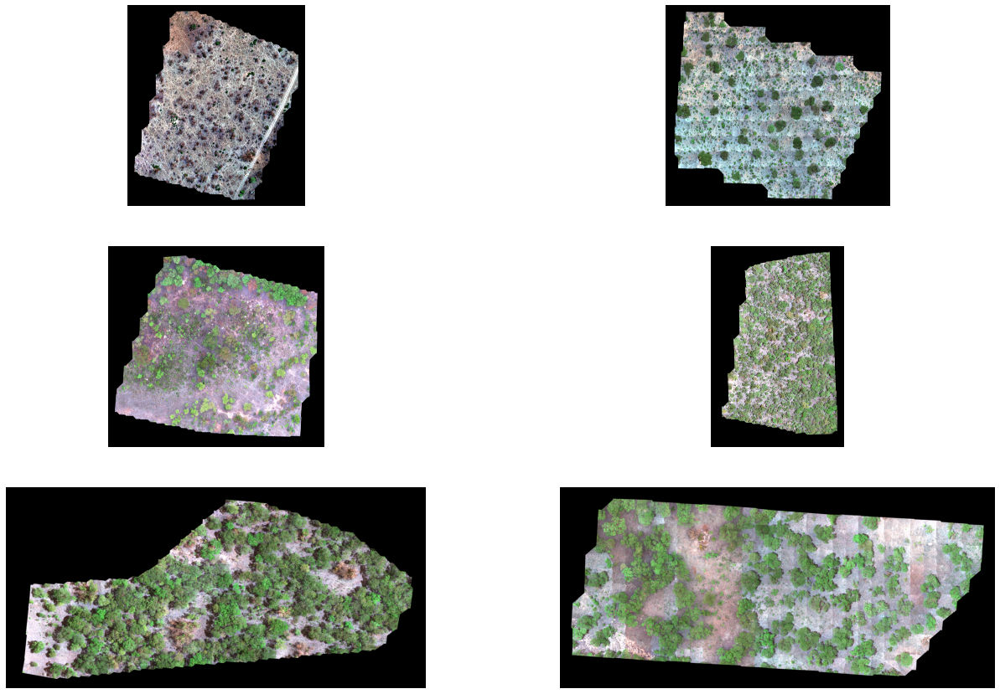

In [21]:
#subplot(r,c) provide the no. of rows and columns
f, axarr = plt.subplots(3, 2, figsize=(22, 15))
[axi.set_axis_off() for axi in axarr.ravel()]

img_base_path = DATA_path+'/2021/img/'
img_array1 = cv2.imread(img_base_path + 'C9.tif'); img_array2 = cv2.imread(img_base_path + 'C11.tif'); img_array3 = cv2.imread(img_base_path + 'ZK10.tif')
img_array4 = cv2.imread(img_base_path + 'ZK14.tif'); img_array5 = cv2.imread(img_base_path + 'ZK15.tif'); img_array6 = cv2.imread(img_base_path + 'ZK21.tif')

#display the images
axarr[0][0].imshow(img_array1); axarr[0][1].imshow(img_array2)
axarr[1][0].imshow(img_array3); axarr[1][1].imshow(img_array4)
axarr[2][0].imshow(img_array5); axarr[2][1].imshow(img_array6)

OpenCV (open computer vision) is a very useful library which has many image manipulation functions and works nicely with matplotlib in this instance. For more, see here: https://docs.opencv.org/4.x/d6/d00/tutorial_py_root.html

BUT since we're working with geographical data, the images also contain a lot of spatial and geographical metadata for which OpenCV isn't helpful. For that, we need to use the GDAL spatial library. GDAL is a great project which forms the basis of a lot of GIS software, including QGIS. For more information on GDAL: https://gdal.org/. 

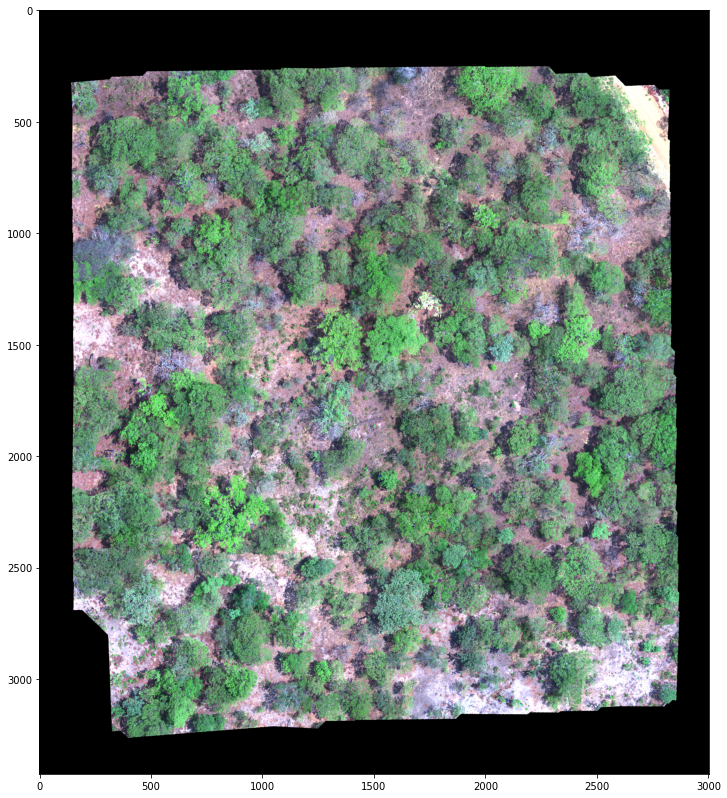

In [ ]:
#import gdal spatial library
from osgeo import gdal

#import numpy
import numpy as np

#open an image into a gdal object
img = gdal.Open(img_path)

#images loaded into gdal can be loaded into numpy arrays, 
#but the bands are loaded slightly differently to opencv
gdal_array = img.ReadAsArray()

#the array is loaded with 4 bands (one alpha/mask band), 
#so we need to ignore the last band AND reshape the array so matplotlib will accept it
reshape_array = np.swapaxes(np.swapaxes(gdal_array,0,2),0,1)
plt.figure(figsize=(12,16))
plt.imshow(reshape_array[:,:,:-1])

We can display geographical metadata of the image using one simple gdal command.
There's a lot going on here, but key attributes are the coordinate system (PROJCS), pixel size and band information.
Note that pixel size is always given in the units the coordinate system is in. UTM coordiate systems are zoned parts of the world (in this case zone 35S) given in metres.

In [ ]:
#display spatial information
print(gdal.Info(img_path))

Driver: GTiff/GeoTIFF
Files: /content/drive/MyDrive/AI_for_Trees_Share/01. Data/2021/img/ZK17.tif
Size is 3004, 3425
Coordinate System is:
PROJCS["WGS 84 / UTM zone 35S",
    GEOGCS["WGS 84",
        DATUM["WGS_1984",
            SPHEROID["WGS 84",6378137,298.257223563,
                AUTHORITY["EPSG","7030"]],
            AUTHORITY["EPSG","6326"]],
        PRIMEM["Greenwich",0,
            AUTHORITY["EPSG","8901"]],
        UNIT["degree",0.0174532925199433,
            AUTHORITY["EPSG","9122"]],
        AUTHORITY["EPSG","4326"]],
    PROJECTION["Transverse_Mercator"],
    PARAMETER["latitude_of_origin",0],
    PARAMETER["central_meridian",27],
    PARAMETER["scale_factor",0.9996],
    PARAMETER["false_easting",500000],
    PARAMETER["false_northing",10000000],
    UNIT["metre",1,
        AUTHORITY["EPSG","9001"]],
    AXIS["Easting",EAST],
    AXIS["Northing",NORTH],
    AUTHORITY["EPSG","32735"]]
Origin = (387115.148700000019744,8288917.845800000242889)
Pixel Size = (0.0553817243674

That's an example of the available image data! But what about the training data?
There are two formats of training data available. The first is in JSON format, and can be displayed in rectangle form.

N.B also available is the geojson format, which instead of pixel coordinates uses geographical coordinates for the bounding boxes. Apart from this, the training data contains the same information in the same format.

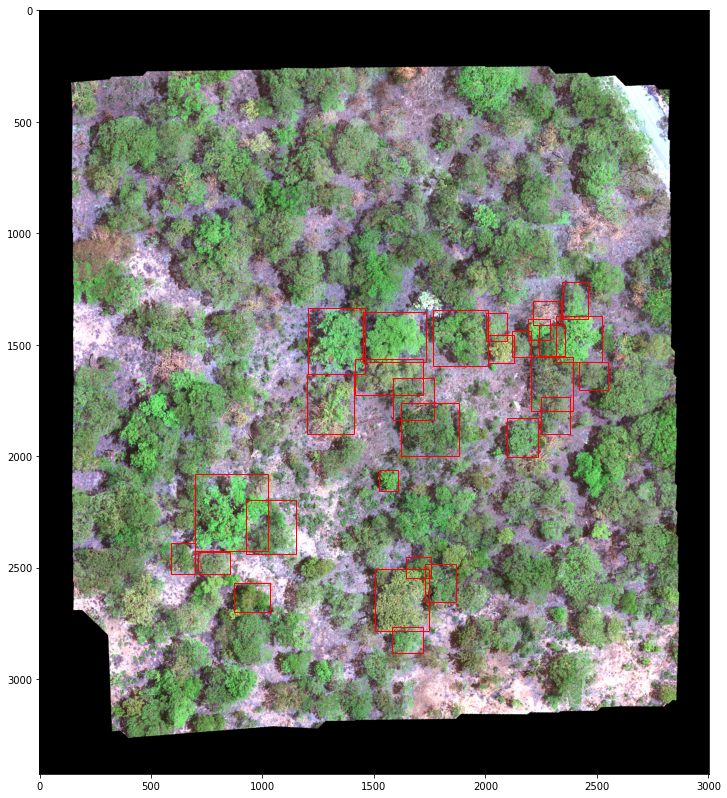

In [ ]:
#import python JSON library
import json
#we'll also need the matplotlib rectangle function
from matplotlib.patches import Rectangle


#path to JSON training data
JSON_path = DATA_path+'/2021/ZK17_coco.json'

#read in JSON object as a python dictionary
with open(JSON_path) as F:
  JSON_data = json.load(F)

#we need to look into the 'annotations' category in the JSON file
annotations = JSON_data['annotations']

#display training rectangles on image
plt.figure(figsize=(12,16))
plt.imshow(img_array)
ax = plt.gca()
for ann in annotations:

  #bounding box & pixel coordinates for each annotation
  bbox = ann['bbox']
  x1, y1, width, height = bbox

  #create the rectangle object and add it to the image
  rect = Rectangle((x1, y1), width, height, fill=False, color='red')
  ax.add_patch(rect)

Now let's look at doing the same, but for the shapefile versions of the training data.
These are georeferenced by default, so we can either plot the georeferenced version (possible, but often complicated) or convert the polygon geographical coordinates to pixel coordinates. Below is an example of the latter option.

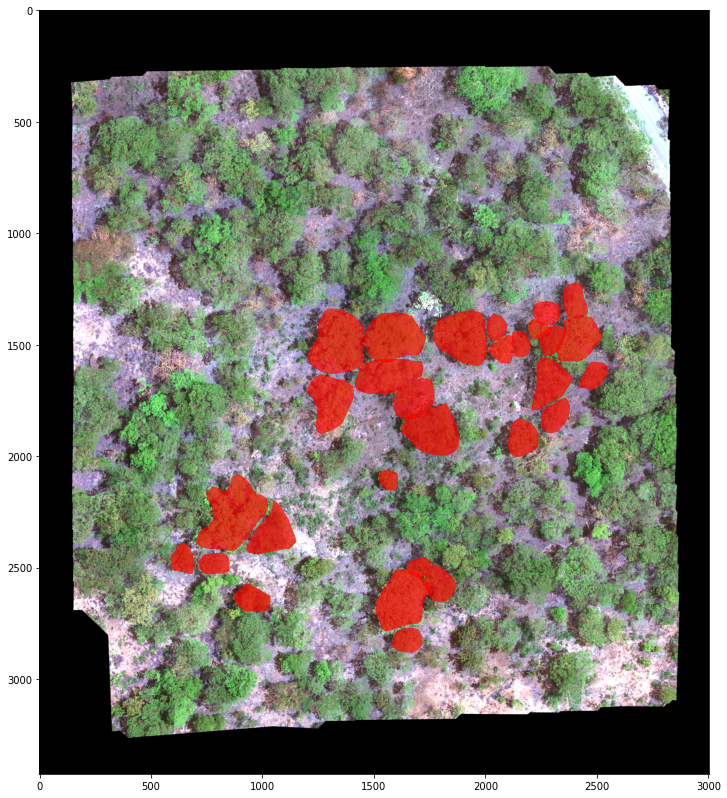

In [ ]:
import geopandas as gpd
from shapely.geometry import Polygon, Point

#path to shapefile training data
shp_path = DATA_path+'/2021/shp/ZK17/ZK17.shp'

#read in shapefile into a GeoDataFrame
gdf = gpd.read_file(shp_path)

#latitude and longitude information can be inferred from the gdal object
geotransform = img.GetGeoTransform()
XSize = img.RasterXSize #image length in X
YSize = img.RasterYSize #image length in Y

#calculate latitude & longitude arrays
lat = np.arange(geotransform[3],geotransform[3] + YSize*geotransform[-1],geotransform[-1])
lon = np.arange(geotransform[0],geotransform[0] + YSize*geotransform[1],geotransform[1])


#base image
fig = plt.figure(figsize=(12,16))
ax = fig.add_subplot(1,1,1)
ax.imshow(img_array)

#we'll also write these new pixel-based polygons to a new GeoDataFrame for safe-keeping.
pixel_gdf = gdf.copy()
i=0
for geom in gdf.geometry:

    #get coordinates of each tree crown
    xs, ys = geom.exterior.xy

    #find the pixel equivalent
    x_pixel = np.array([np.where(abs(lon-x) == min(abs(lon-x)))[0] for x in xs])
    y_pixel = np.array([np.where(abs(lat-y) == min(abs(lat-y)))[0] for y in ys])

    #draw the tree crown
    ax.fill(x_pixel, y_pixel, alpha=0.7, fc='r', ec='none')

    #save the converted polygons as geometries
    coords = []
    for k in range(len(x_pixel)):
      coords.append(Point(x_pixel[k], y_pixel[k]))

    pixel_gdf.geometry.iloc[i] = Polygon(coords)
    i+=1

It's also possible to find some attributes of the tree crowns. Let's find the area of the tree crowns in the training data set, and display this on a plot.

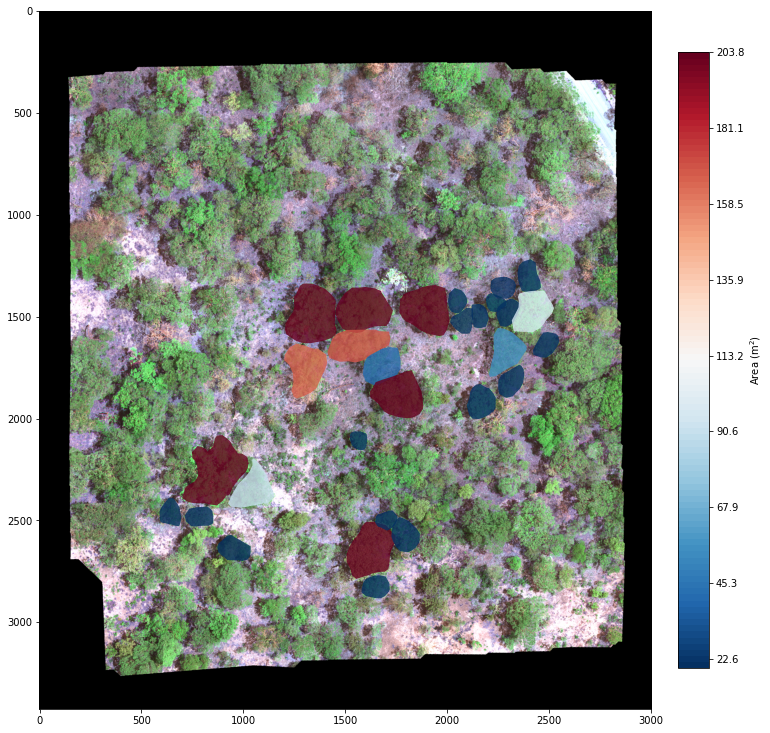

In [ ]:
from sklearn.preprocessing import scale
import matplotlib as mpl

#area of each polygon 
#important to check the units here. As we are using UTM coordinates, in this case the units are already in m^2!
#This is one of the main reasons why UTM coordinates are so useful
areas = gdf.geometry.area.values


#create a color map with 100 segments
cmap = plt.get_cmap('RdBu_r', 100)

#base image
fig = plt.figure(figsize=(12,16))
ax = fig.add_subplot(1,1,1)
ax.imshow(img_array)

#same as before except this time use a normalised measure of the area to scale the colormap
i=0
for geom in pixel_gdf.geometry:

  #get coordinates of each tree crown
  xs, ys = geom.exterior.xy

  ax.fill(xs, ys, alpha=0.8, fc=cmap(scale(areas)[i]), ec='none')
  i+=1

#some normalising and fiddling for the colorbar
norm = mpl.colors.Normalize(vmin=min(areas), vmax=max(areas))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
  
plt.colorbar(sm, ticks=np.linspace(0,max(areas), 10), ax = ax, fraction=0.046, pad=0.04, label = "Area (m$^2$)")

Let's have a look at another type of data: the Digital Elevation Model (DEM)

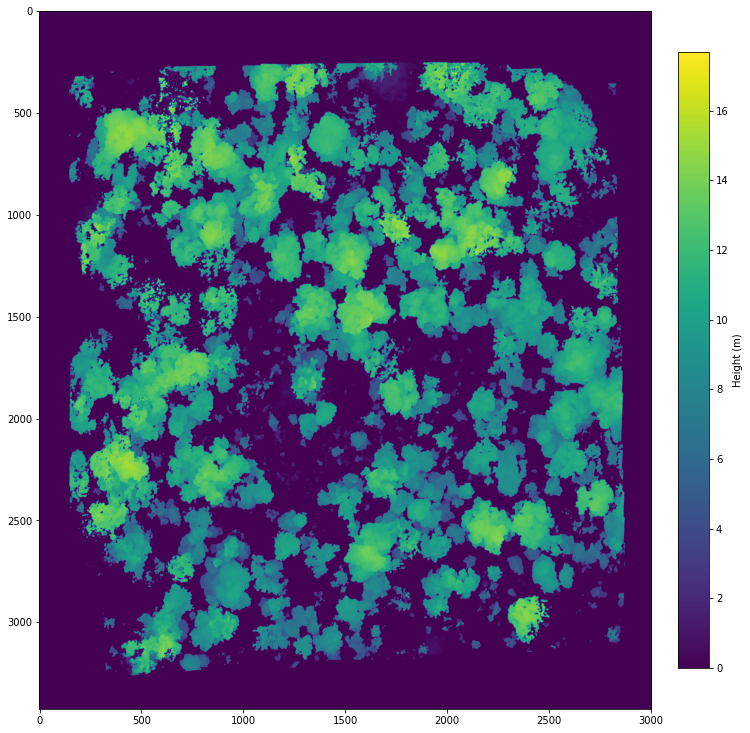

In [ ]:
#path to DEM
DEM_path = DATA_path+'/2021/brandt/ZK17_dem.tif'

#visualise the DEM
DEM = gdal.Open(DEM_path).ReadAsArray()

#set all values which are invalid to zero
DEM[DEM<0] = 0

plt.figure(figsize=(12,16))
plot = plt.imshow(DEM)
plt.colorbar(plot, fraction=0.046, pad=0.04, label = "Height (m)")
plt.show()

A quick  GDAL command lets us calculate the slope of the DEM. This could be very useful!

Check out GDAL's tutorials and documentation for more useful commands like this one 

In [ ]:
#for shell commands, add backslash before any whitespace
usepath = DATA_path.replace(' ','\ ')
!gdaldem slope $usepath'/2021/brandt/ZK17_dem.tif' $usepath'/2021/brandt/ZK17_slope.tif'

0...10...20...30...40...50...60...70...80...90...100 - done.


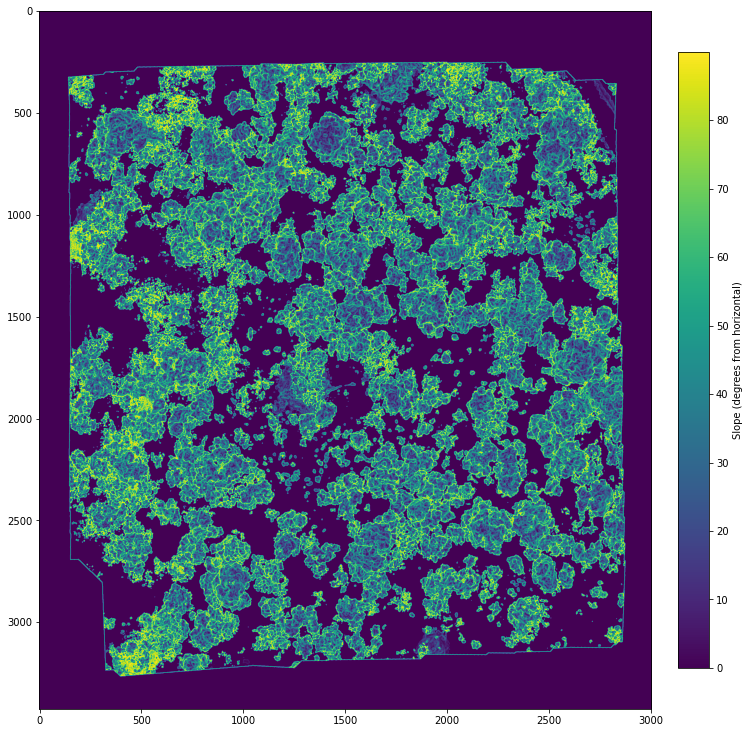

In [ ]:
#path to newly calculated slope
slope_path = DATA_path+'/2021/brandt/ZK17_slope.tif'

#visualise the DEM
slope = gdal.Open(slope_path).ReadAsArray()

#set all values which are invalid to zero
slope[slope<0] = 0

plt.figure(figsize=(12,16))
plot = plt.imshow(slope)
plt.colorbar(plot, fraction=0.046, pad=0.04, label = "Slope (degrees from horizontal)")
plt.show()

We can use the shapefile training data to work out the maximum height of each tree crown.

In [ ]:
from matplotlib.path import Path

#x/y pixel grid for DEM
xx, yy = np.meshgrid(np.arange(len(DEM[0])), np.arange(len(DEM)))
x,y = xx.flatten(), yy.flatten()

heights = []
for geom in pixel_gdf.geometry:

  #get the bounding line of the geometry
  BoundingLine = geom.exterior.xy

  #reformat enclosing line coordinates into something matplotlib will accept
  bounds = []
  for k in range(len(BoundingLine[0])):
    bounds.append([BoundingLine[0][k], BoundingLine[1][k]])

  #isolate points contained within the polygon
  path = Path(bounds)
  mask = path.contains_points(np.swapaxes(np.array([x,y]),0,1))

  #find the maximum height on the DEM within the tree crown
  max_height = np.max(DEM[mask.reshape(DEM.shape)])
  heights.append(max_height)

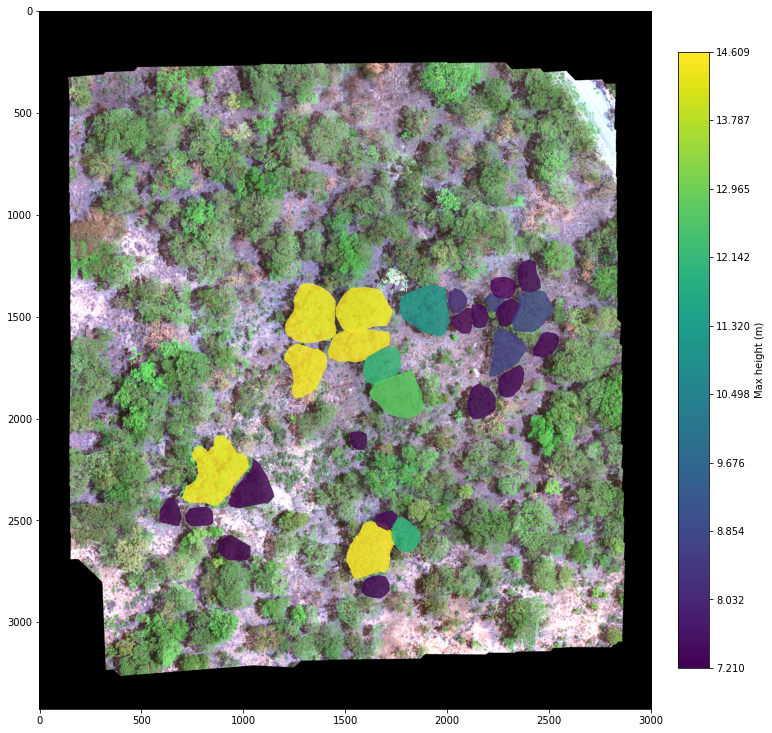

In [ ]:
#now we can plot this in the same way we did with the areas

#create a color map with 10 segments
cmap = plt.get_cmap('viridis', 100)

#base image
fig = plt.figure(figsize=(12,16))
ax = fig.add_subplot(1,1,1)
ax.imshow(img_array)

#same as before except this time use a normalised measure of the area to scale the colormap
i=0
for geom in pixel_gdf.geometry:

  #get coordinates of each tree crown
  xs, ys = geom.exterior.xy

  ax.fill(xs, ys, alpha=0.8, fc=cmap(scale(heights)[i]), ec='none')
  i+=1

#some normalising and fiddling for the colorbar
norm = mpl.colors.Normalize(vmin=min(heights), vmax=max(heights))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
  
plt.colorbar(sm, ticks=np.linspace(min(heights), max(heights), 10), ax = ax, fraction=0.046, pad=0.04, label = "Max height (m)")

For completeness, we'll also just look at the panchromatic image. All this is is a greyscale version of the original image.

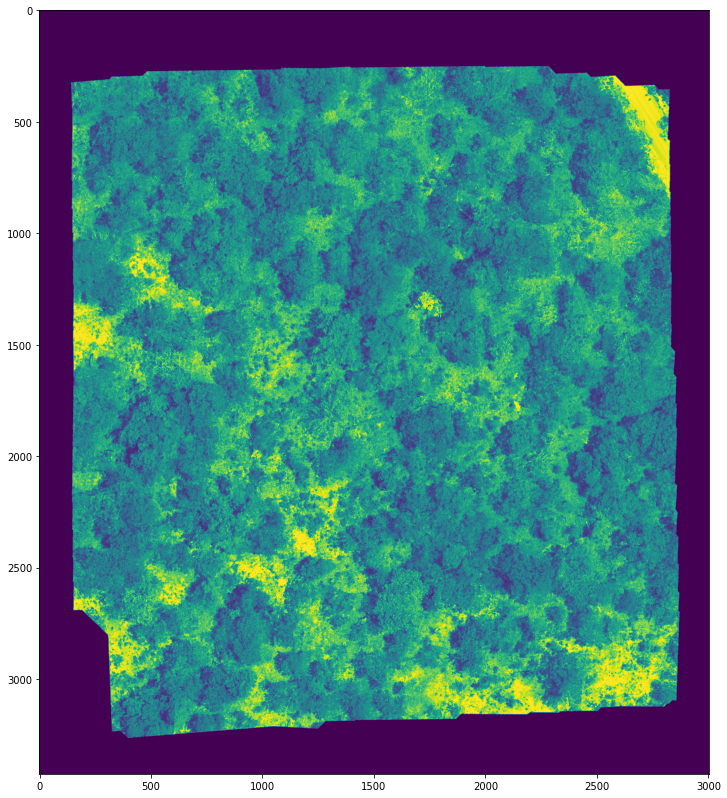

In [ ]:
#path to NDVI 
pan_path = DATA_path+'/2021/brandt/ZK17_pan.tif'

#read NDVI in as array
pan = gdal.Open(pan_path).ReadAsArray()

#plot the NDVI
plt.figure(figsize=(12,16))
plot = plt.imshow(pan)

Lastly, also available is NDVI (Normalised Difference Vegetation Index) calculated from red and near-infrared bands. 

NDVI = (NIR-R)/(NIR+R)

NDVI is always between -1 to +1, and gives an indication of the presence and health of vegetation. For more info, see here: https://gisgeography.com/ndvi-normalized-difference-vegetation-index/

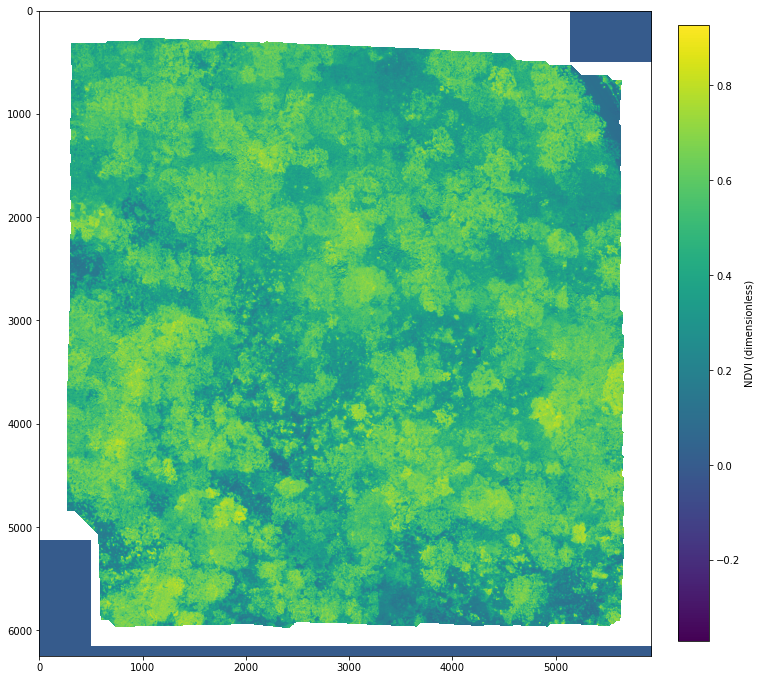

In [ ]:
#path to NDVI 
NDVI_path = DATA_path+'/2021/brandt/ZK17_ndvi.tif'

#read NDVI in as array
NDVI = gdal.Open(NDVI_path).ReadAsArray()

#plot the NDVI
plt.figure(figsize=(12,16))
plot = plt.imshow(NDVI)
plt.colorbar(plot, fraction=0.046, pad=0.04, label = "NDVI (dimensionless)")
plt.show()